<a href="https://colab.research.google.com/github/XinxinWu544/fronts-and-cyclones/blob/main/MOAAP_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Multi-Object Analysis of Atmospheric Phenomena (MOAAP) Tutorial**

> This notebook allows you to run the MOAAP algorithm on an example dataset and visualize its output. The configuration of MOAAP is the same as in [Prein et al. (2023)](https://essopenarchive.org/users/489196/articles/621516-the-multi-scale-interactions-of-atmospheric-phenomenon-in-extreme-and-mean-precipitation) including the input data except that only 24-hours of data are loaded due to memory restrictions in Google Colaboratory. The short time period does not allow to classify equatorial waves.

The tutorial is intended to lower the barrier of running MOAAP by showcasing the format of its input variables and the analysis and visualization of its output.

The notebook runs through the following steps:


1.   Load and install Python packages
2.   Get the latest version of MOAAP from [github](https://github.com/AndreasPrein/MOAAP)
3.   Get example data from Google Drive to run MOAAP
4.   Read and visualize MOAAP output

More information about the MOAAP algorithm can be found on the [MOAAP wiki](https://github.com/AndreasPrein/MOAAP/wiki) and in [Prein et al. (2023)](https://essopenarchive.org/users/489196/articles/621516-the-multi-scale-interactions-of-atmospheric-phenomenon-in-extreme-and-mean-precipitation). A video that introduces this tutorial is available on [Youtube](https://youtu.be/K5XkHX--sqY).

For questions and feedback please contact Andreas F. Prein (prein@ucar.edu).





### 1) Load and install Python packages

In [ ]:
import xarray as xr
!pip install netCDF4
import netCDF4
!pip install cartopy
import cartopy
import numpy as np
import pandas as pd
!pip install metpy
import metpy
import warnings
warnings.filterwarnings("ignore")
from tqdm import tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 84.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.5/400.5 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.0/294.0 kB 42.1 MB/s eta 0:00:00


### 2) Get the latest version of MOAAP from github


In [ ]:
!git clone https://github.com/AndreasPrein/MOAAP.git

Cloning into 'MOAAP'...
remote: Enumerating objects: 59, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 59 (delta 28), reused 5 (delta 2), pack-reused 0
Receiving objects: 100% (59/59), 72.47 KiB | 927.00 KiB/s, done.
Resolving deltas: 100% (28/28), done.


In [ ]:
!mv "MOAAP/Tracking_Functions.py" "."
from Tracking_Functions import moaap

### 3) Get example data from Google Drive to run MOAAP


In [ ]:
!gdown 1hD9hD3c9rBhcTN-c5FN87l0pHp_SCscE

Downloading...
From: https://drive.google.com/uc?id=1hD9hD3c9rBhcTN-c5FN87l0pHp_SCscE
To: /content/20210701-04_MOAAP-Input_24h.nc
100% 2.41G/2.41G [00:26<00:00, 91.8MB/s]


In [ ]:
data_vars = xr.open_dataset('20210701-04_MOAAP-Input_24h.nc')

In [ ]:
dT = 1 # time interval of input files [hours]
Mask = np.copy(data_vars['lon']); Mask[:]=1 # tracking is applied globally
DataName = 'ERA5'
OutputFolder = 'moaap_output/'
!mkdir $OutputFolder
time_datetime = pd.to_datetime(np.array(data_vars['time'].values, dtype='datetime64'))

In [ ]:
object_split = moaap(
                      data_vars['lon'],
                      data_vars['lat'],
                      time_datetime,
                      dT,
                      Mask,
                      v850 = data_vars['V850'],
                      u850 = data_vars['U850'],
                      t850 = data_vars['T850'],
                      q850 = data_vars['Q850'],
                      slp = data_vars['SLP'],
                      ivte = data_vars['IVTE'],
                      ivtn = data_vars['IVTN'],
                      z500 = data_vars['Z500'],
                      v200 = data_vars['V200'],
                      u200 = data_vars['U200'],
                      pr   = data_vars['PR'],
                      tb   = data_vars['Tb'],
                      DataName = DataName,
                      OutputFolder = OutputFolder,
                      js_min_anomaly = 12,
                      MinTimeJS = 12,
                        )

 
The provided variables allow tracking the following phenomena
 
|  phenomenon  | tracking |
---------------------------
   Jetstream   |   yes
   PSL CY/ACY  |   yes
   Z500 CY/ACY |   yes
   COLs        |   yes
   IVT ARs     |   yes
   MS ARs      |   yes
   Fronts      |   yes
   TCs         |   yes
   MCSs        |   yes
   Equ. Waves  |   yes
---------------------------
 
======> track jetstream
            25 object found
        break up long living CY objects that heve many elements


100%|██████████| 19/19 [00:00<00:00, 59.21it/s]


        00:00:01.44
        connect cyclones objects over date line
            Loop over 20 objects
        00:00:04.72
======> track tropical waves
        track tropical waves
            work on ER
                8 object found
                break up long tropical waves that heve many elements


0it [00:00, ?it/s]


        00:00:00.97
                connect waves objects over date line
            work on MRG
                0 object found
                break up long tropical waves that heve many elements


0it [00:00, ?it/s]


        00:00:00.96
                connect waves objects over date line
            work on IGW
                0 object found
                break up long tropical waves that heve many elements


0it [00:00, ?it/s]


        00:00:00.97
                connect waves objects over date line
            work on Kelvin
                0 object found
                break up long tropical waves that heve many elements


0it [00:00, ?it/s]


        00:00:01.76
                connect waves objects over date line
            work on Eig0
                0 object found
                break up long tropical waves that heve many elements


0it [00:00, ?it/s]


        00:00:00.96
                connect waves objects over date line
        00:00:17.84
======> track moisture streams and atmospheric rivers (ARs)
            447 object found
        break up long living MS objects that have many elements


100%|██████████| 25/25 [00:01<00:00, 24.46it/s]


        00:00:02.04
        connect MS objects over date line
            Loop over 57 objects
        00:00:04.72
======> track IVT streams and atmospheric rivers (ARs)
        149 object found
        break up long living IVT objects that have many elements


100%|██████████| 36/36 [00:00<00:00, 80.08it/s]


        00:00:01.45
        connect IVT objects over date line
            Loop over 53 objects
        check if MSs quallify as ARs
            Loop over 46 objects
        00:00:05.19
======> identify frontal zones
        56194 object found
        00:00:06.24
======> track cyclones from PSL
        track cyclones
            70 object found
            break up long living CY objects that heve many elements


100%|██████████| 25/25 [00:00<00:00, 44.45it/s]


        00:00:01.77
            connect cyclones objects over date line
        track anti-cyclones
        103 object found
            break up long living ACY objects that have many elements


100%|██████████| 24/24 [00:01<00:00, 16.21it/s]


        00:00:03.25
            Loop over 27 objects
            Loop over 27 objects
        00:00:09.43
======> track cyclones from Z500
    track 500 hPa cyclones
            35 object found
        break up long living CY objects that heve many elements


100%|██████████| 23/23 [00:00<00:00, 51.37it/s]


        00:00:01.68
        connect cyclones objects over date line
    track 500 hPa anticyclones
            22 object found
        break up long living CY objects that heve many elements


100%|██████████| 15/15 [00:00<00:00, 39.51it/s]


        00:00:01.60
        connect cyclones objects over date line
            Loop over 26 objects
            Loop over 16 objects
    Check if cyclones qualify as Cut Off Low (COL)
            Loop over 24 objects
        00:00:09.51
======> 'check if Tb objects quallify as MCS (or selected storm type)
        track  clouds
        8339 cloud object found
        break up long living cloud shield objects that have many elements


100%|██████████| 64/64 [00:05<00:00, 12.57it/s]


        00:00:06.47
        connect cloud objects over date line


615it [00:01, 333.00it/s]


            Loop over 615 objects
            Loop over 58 objects
        00:00:13.91
======> Check if cyclones qualify as TCs
        00:00:01.02
 
Save the object masks into a joint netCDF
Saved: moaap_output/202107_ERA5_ObjectMasks_ERA5_dt-1h_MOAAP-masks.nc
        00:00:45.52


### 4) Read and visualize MOAAP output

In [ ]:
data_moaap = xr.open_dataset('moaap_output/202107_ERA5_ObjectMasks_ERA5_dt-1h_MOAAP-masks.nc')

In [ ]:
# load MCS characteristics
import pickle
with open('moaap_output/MCSs_202107_ERA5_dt-1h_MOAAP-masks.pkl', 'rb') as f:
    mcs_charac = pickle.load(f)

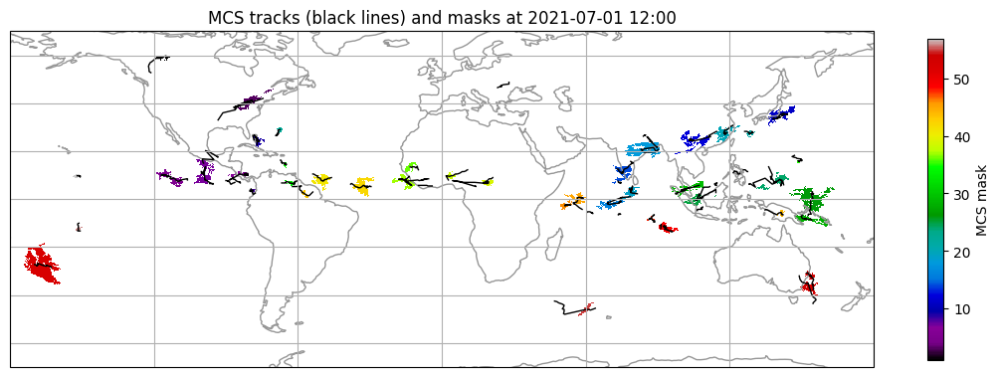

In [ ]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

# Create a figure and axis with a PlateCarree projection (latitude and longitude)
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()},
                       figsize=(14,6))

# Set the extent of the map (in this case, the entire globe)
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())

# Add coastlines and gridlines for reference
ax.coastlines(color='#969696')
ax.gridlines()

# Generate some random data (latitude, longitude, and values)
mcs_mask = np.array(data_moaap['MCS_Tb_Objects'][12,:,:])
mcs_mask[mcs_mask == 0] = np.nan
sc = plt.pcolormesh(data_moaap['lon'],
                    data_moaap['lat'],
                    mcs_mask,
                    cmap = 'nipy_spectral')


# plot MCS tracks
for ii in range(len(mcs_charac.keys())):
  LatLonTrack = mcs_charac[list(mcs_charac.keys())[ii]]['track']
  plt.plot(LatLonTrack[:,1],LatLonTrack[:,0], transform=ccrs.PlateCarree(), lw=1, color='k')

ax.set_extent([-180, 180, -70, 70], crs=ccrs.PlateCarree())

# Add a colorbar to the plot
cbar = plt.colorbar(sc, ax=ax, orientation='vertical', shrink=0.7, label='MCS mask')

# Set the title of the plot
plt.title('MCS tracks (black lines) and masks at '+str(time_datetime[12])[:16])

# Show the plot
plt.show()


Text(0, 0.5, 'precipitation [mm h$^{-1}$]')

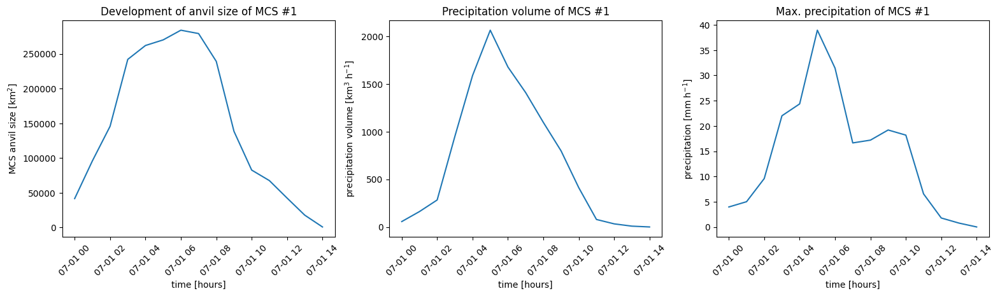

In [ ]:
import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=(15,4))
gs1 = gridspec.GridSpec(1,3)
gs1.update(left=0.01, right=0.98,
           bottom=0.1, top=0.95,
           wspace=0.2, hspace=0.2)

obj = '1'

# MCS anvile size
ax = plt.subplot(gs1[0,0])
plt.title('Development of anvil size of MCS #' + obj)
plt.plot(mcs_charac[obj]['times'], mcs_charac[obj]['size']/1000**2)

ax.set_xlabel('time [hours]')
plt.xticks(rotation=45)
ax.set_ylabel('MCS anvil size [km$^2$]')

# MCS volume precipitation
ax = plt.subplot(gs1[0,1])
plt.title('Precipitation volume of MCS #' + obj)
plt.plot(mcs_charac[obj]['times'], mcs_charac[obj]['tot'])
ax.set_xlabel('time [hours]')
plt.xticks(rotation=45)
ax.set_ylabel('precipitation volume [km$^{3}$ h$^{-1}$]')

# MCS maximum precipitation
ax = plt.subplot(gs1[0,2])
plt.title('Max. precipitation of MCS #' + obj)
plt.plot(mcs_charac[obj]['times'], mcs_charac[obj]['max'])
ax.set_xlabel('time [hours]')
plt.xticks(rotation=45)
ax.set_ylabel('precipitation [mm h$^{-1}$]')

In [ ]:
object_names = [['cold clouds', '#737373', '-', 2],
                ['surface cyclones', 'k', '-', 2],
                ['mid-level cyclones', 'k', '--', 2],
                ['anticyclones', '#ff7f00', '-', 2],
                ['MCS', '#33a02c', '-', 2],
                ['moisture streams', 'r', '-', 2],
                ['jets', '#6a3d9a', '-', 2],
                ['Rossby waves', '#8c510a', '-', 3],
                ['mixed Rossby gravity waves', '#bf812d', '-', 1.5],
                ['inertia gravity waves', '#dfc27d','-', 3],
                ['Kelvin waves', '#abd9e9','-', 1.5],
                ['eastward inertia gravity waves', '#4575b4', '-', 3],
                ['fronts', '#cab2d6', '-', 2]]

100%|██████████| 24/24 [00:35<00:00,  1.46s/it]


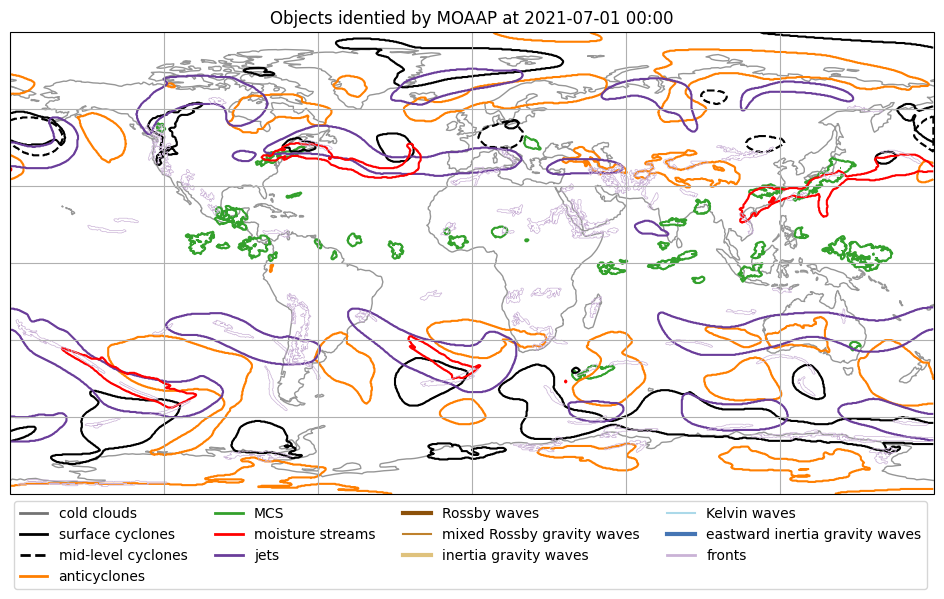

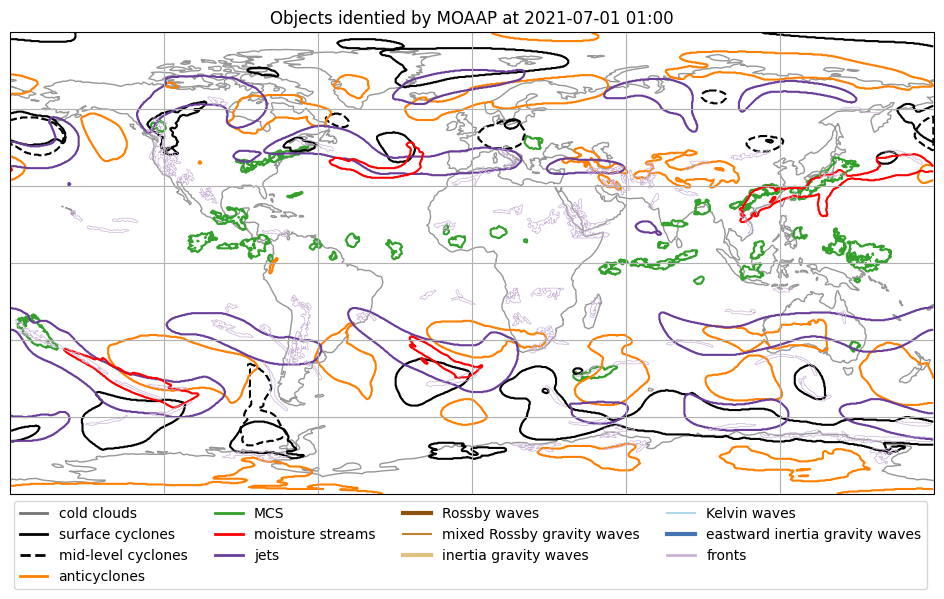

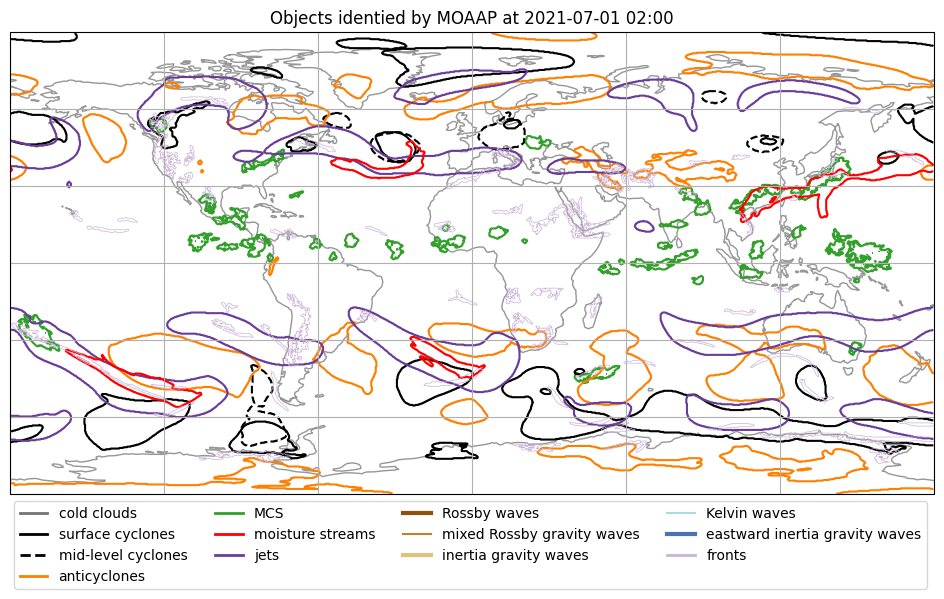

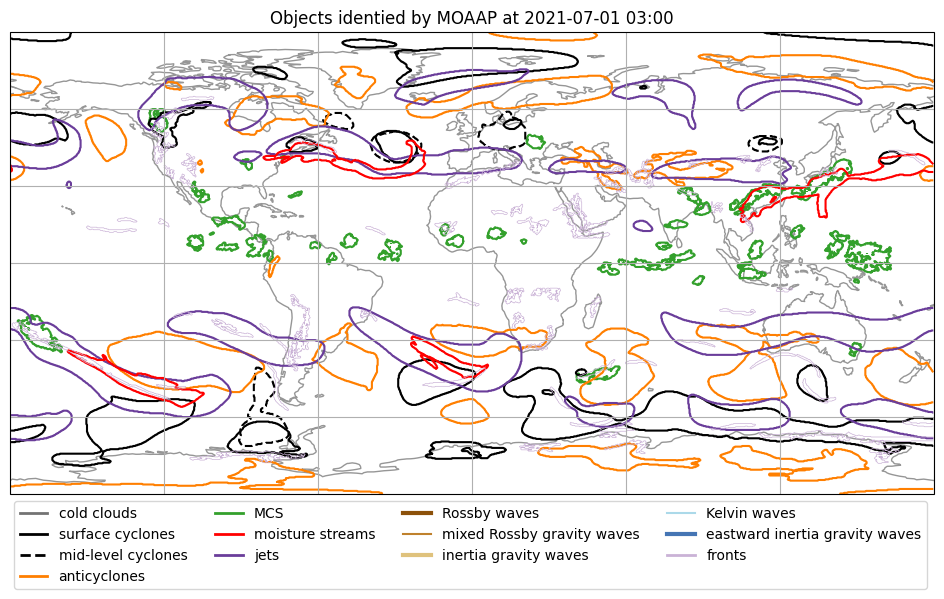

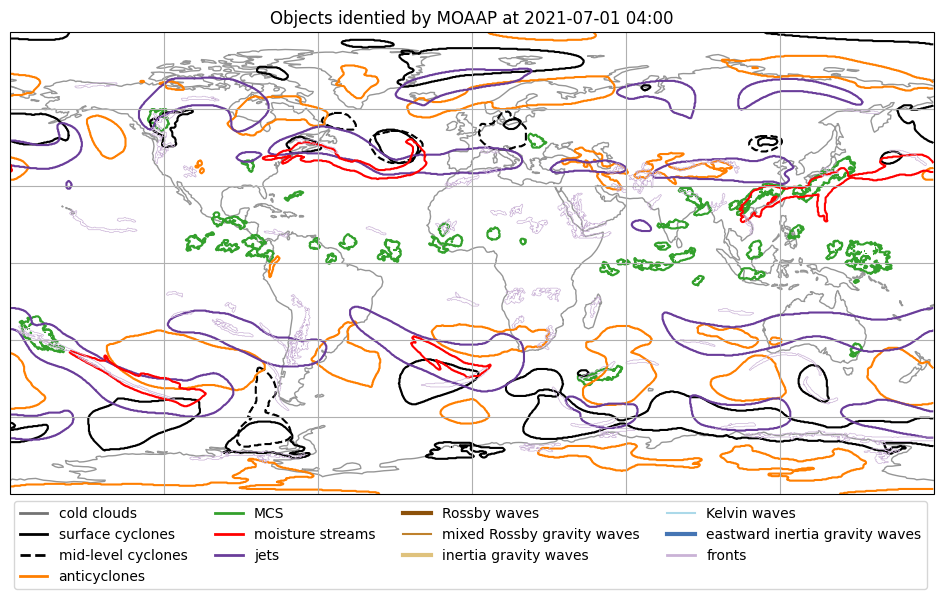

...

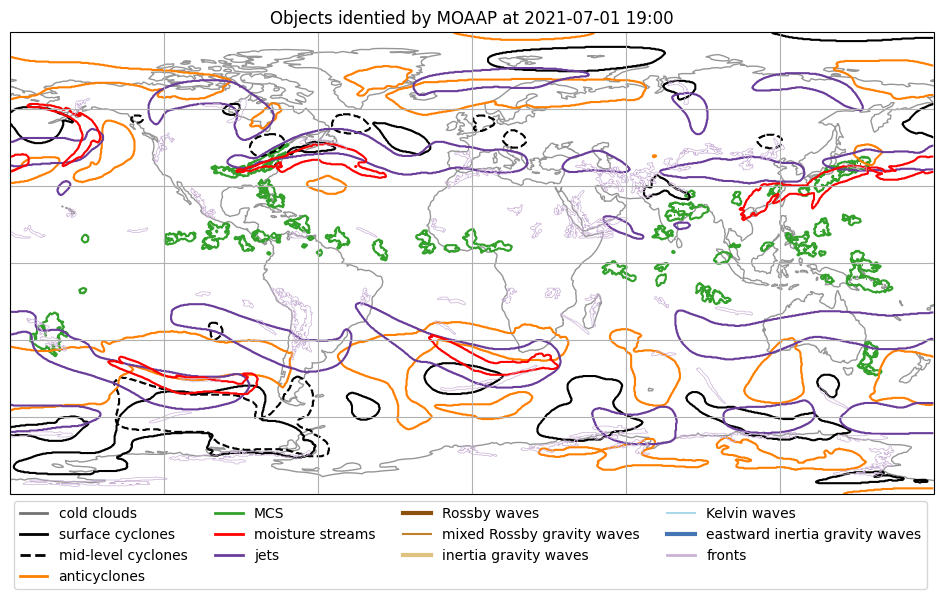

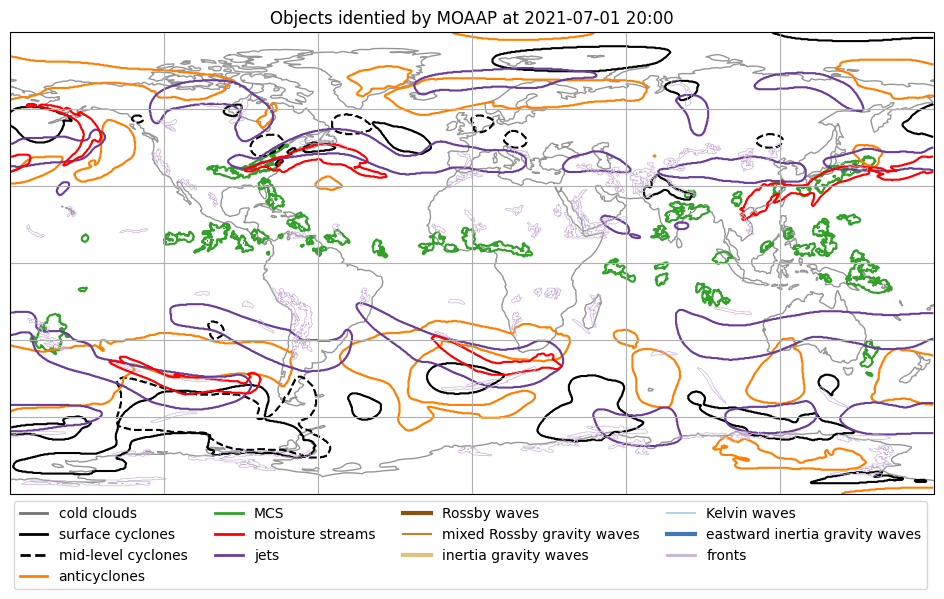

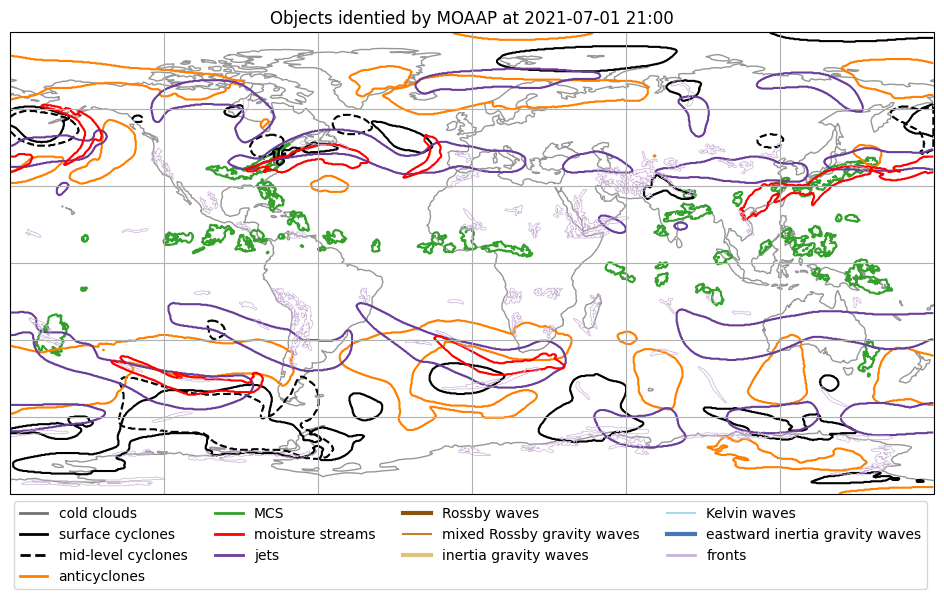

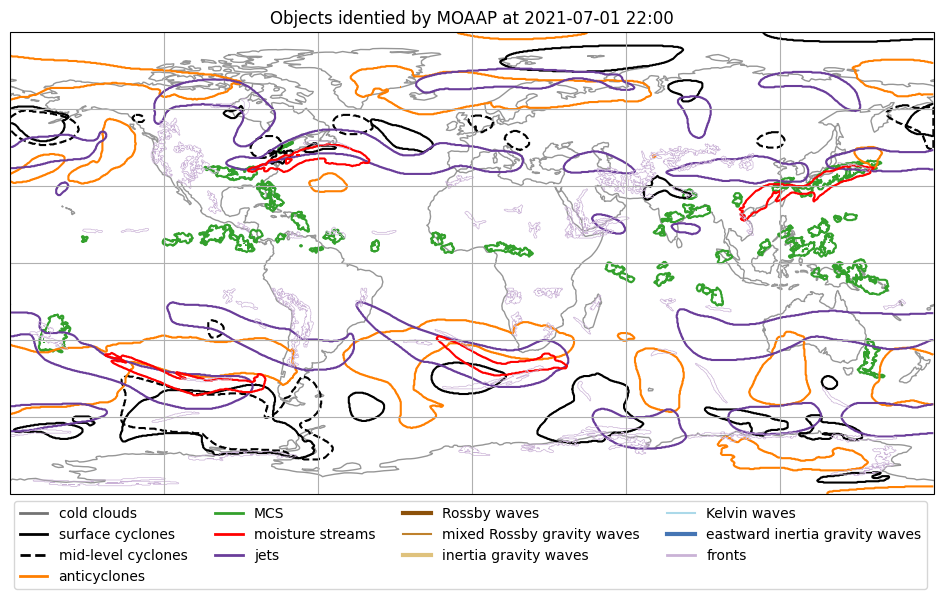

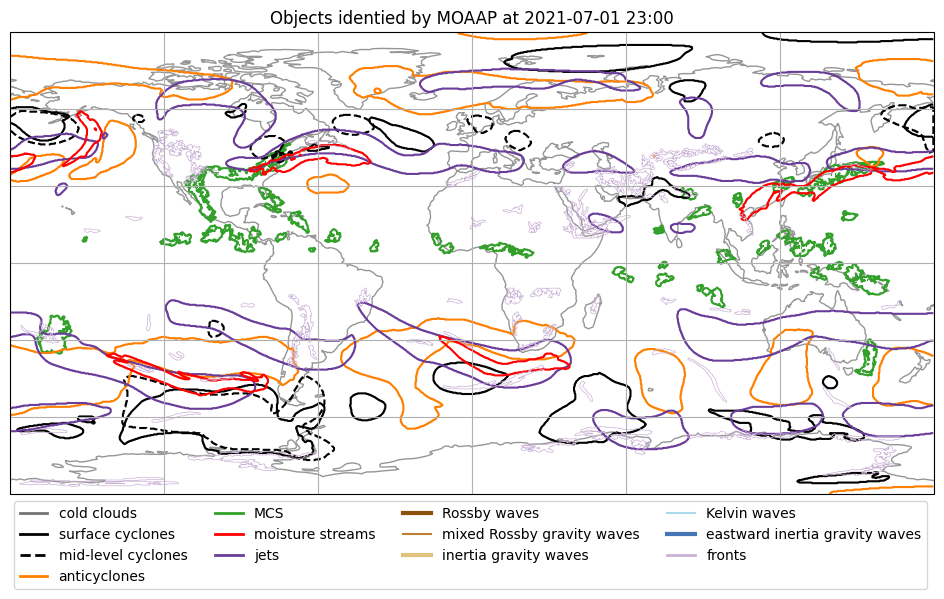

In [ ]:
!mkdir 'images'

for tt in tqdm(range(len(time_datetime))):

    # Create a figure and axis with a PlateCarree projection (latitude and longitude)
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()},
                          figsize=(14,6))

    # Set the extent of the map (in this case, the entire globe)
    # ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())

    # Add coastlines and gridlines for reference
    ax.coastlines(color='#969696')
    ax.gridlines()

    # MCSs
    sc = plt.contour(data_moaap['lon'],
                        data_moaap['lat'],
                        np.array(data_moaap['MCS_Tb_Objects'][tt,:,:])>0,
                        colors = '#33a02c', levels=range(0,2,1))

    # Mid-Level Cyclones
    sc = plt.contour(data_moaap['lon'],
                        data_moaap['lat'],
                        np.array(data_moaap['CY_Objects'][tt,:,:])>0,
                        colors = 'k', levels=range(0,2,1))

    # COL
    sc = plt.contour(data_moaap['lon'],
                        data_moaap['lat'],
                        np.array(data_moaap['COL_Objects'][tt,:,:])>0,
                        colors = 'k', levels=range(0,2,1), linestyles = '--')

    # Anticyclones
    sc = plt.contour(data_moaap['lon'],
                        data_moaap['lat'],
                        np.array(data_moaap['ACY_Objects'][tt,:,:])>0,
                        colors = '#ff7f00', levels=range(0,2,1))

    # Jets
    sc = plt.contour(data_moaap['lon'],
                        data_moaap['lat'],
                        np.array(data_moaap['JET_Objects'][tt,:,:])>0,
                        colors = '#6a3d9a', levels=range(0,2,1))

    # ARs
    sc = plt.contour(data_moaap['lon'],
                        data_moaap['lat'],
                        np.array(data_moaap['AR_Objects'][tt,:,:])>0,
                        colors = 'r', levels=range(0,2,1))

    # Fronts
    sc = plt.contour(data_moaap['lon'],
                        data_moaap['lat'],
                        np.array(data_moaap['FR_Objects'][tt,:,:])>1,
                        colors = '#cab2d6', levels=range(0,2,1),
                        linewidths = 0.5)

    # Equatorial Rossby Wave
    sc = plt.contour(data_moaap['lon'],
                        data_moaap['lat'],
                        np.array(data_moaap['ER_Objects'][tt,:,:])>1,
                        colors = '#8c510a', levels=range(0,2,1),
                        linewidths = 0.5)


    ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())

    # Set the title of the plot
    plt.title('Objects identied by MOAAP at '+str(time_datetime[tt])[:16])

    # create legend
    for ob in range(len(object_names)):
      plt.plot([],[], color = object_names[ob][1], \
               linestyle = object_names[ob][2],\
               lw = object_names[ob][3],\
               label = object_names[ob][0])

    # plt.legend()
    ax.legend(bbox_to_anchor=(1, 0.00), ncol=4)


    # Show the plot
    fig.savefig('images/'+str(tt).zfill(3)+'_CausesOfExtreme_100_daily-extremes.jpg', bbox_inches='tight', dpi=100)
    # plt.close()



In [ ]:
import glob

from PIL import Image
def make_gif(frame_folder):
    frames = [Image.open(image) for image in np.sort(glob.glob(f"{frame_folder}/*.jpg"))]
    frame_one = frames[0]
    frame_one.save("phenomenon.gif", format="GIF", append_images=frames,
               save_all=True, duration=100, loop=0)

# if __name__ == "__main__":
make_gif("images/")


In [ ]:
%matplotlib inline

from IPython import display
# gifPath = Path("phenomenon.gif") # please paste the whole path from Step 2-6
# Display GIF in Jupyter, CoLab, IPython
with open("phenomenon.gif",'rb') as f:
    display.Image(data=f.read(), format='jpg')

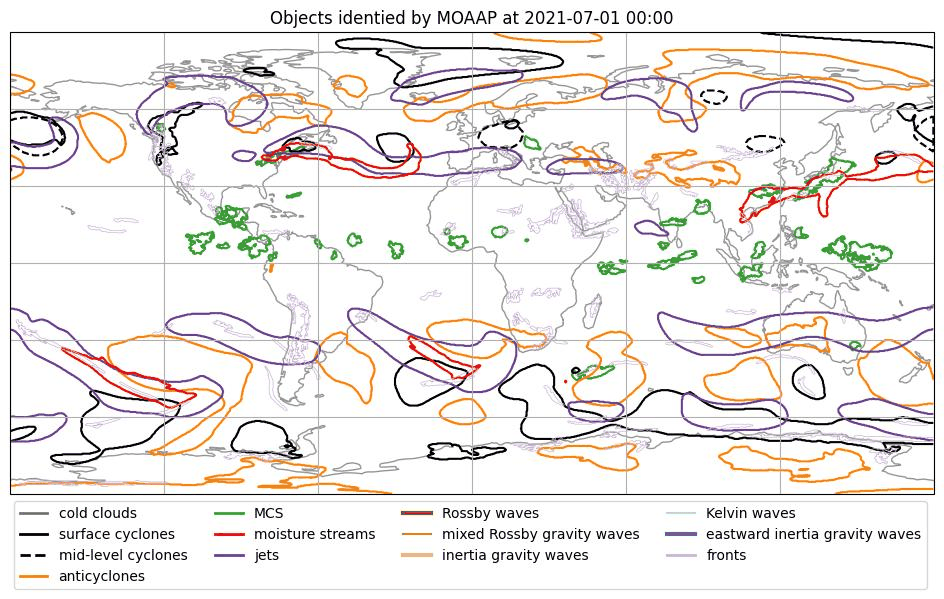

In [ ]:
from IPython.display import Image
fname = '/content/phenomenon.gif'
Image(open(fname, 'rb').read())